01-01-2018 to 01-01-2021


In [67]:
#importing required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use("seaborn")

Tesla stock prices from 01-01-2018 to 01-01-2021

In [68]:
df=pd.read_csv("https://query1.finance.yahoo.com/v7/finance/download/TSLA?period1=1514764800&period2=1609459200&interval=1d&events=history&includeAdjustedClose=true");

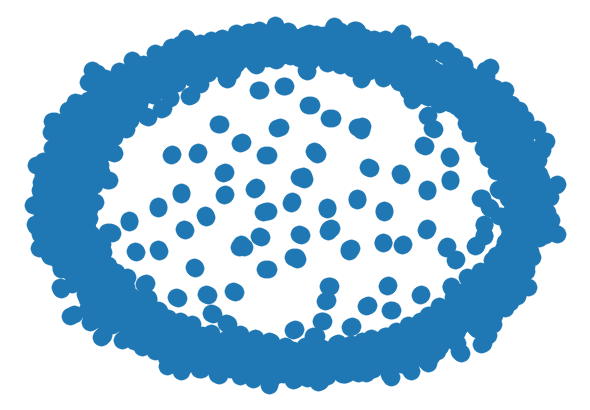

In [69]:
G = nx.from_pandas_edgelist(df, 'Low', 'Volume')
nx.draw(G)#nx.draw(G)plt.show()

In [70]:
df.shape
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 756 entries, 0 to 755
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       756 non-null    object 
 1   Open       756 non-null    float64
 2   High       756 non-null    float64
 3   Low        756 non-null    float64
 4   Close      756 non-null    float64
 5   Adj Close  756 non-null    float64
 6   Volume     756 non-null    int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 41.5+ KB


,Date,Open,High,Low,Close,Adj Close,Volume
0,2018-01-02,62.400002,64.421997,62.200001,64.106003,64.106003,21761000
1,2018-01-03,64.199997,65.050003,63.110001,63.450001,63.450001,22607500
2,2018-01-04,62.574001,63.709999,61.136002,62.924000,62.924000,49731500
3,2018-01-05,63.324001,63.448002,62.400002,63.316002,63.316002,22956000
4,2018-01-08,63.200001,67.403999,63.099998,67.281998,67.281998,49297000


In [71]:
cor_matrix = df.corr()
cor_matrix.head()

,Open,High,Low,Close,Adj Close,Volume
Open,1.000000,0.999416,0.999273,0.998723,0.998723,0.151864
High,0.999416,1.000000,0.999130,0.999501,0.999501,0.162951
Low,0.999273,0.999130,1.000000,0.999275,0.999275,0.140975
Close,0.998723,0.999501,0.999275,1.000000,1.000000,0.153492
Adj Close,0.998723,0.999501,0.999275,1.000000,1.000000,0.153492


In [72]:
stocks = cor_matrix.index.values
cor_matrix = np.asmatrix(cor_matrix)

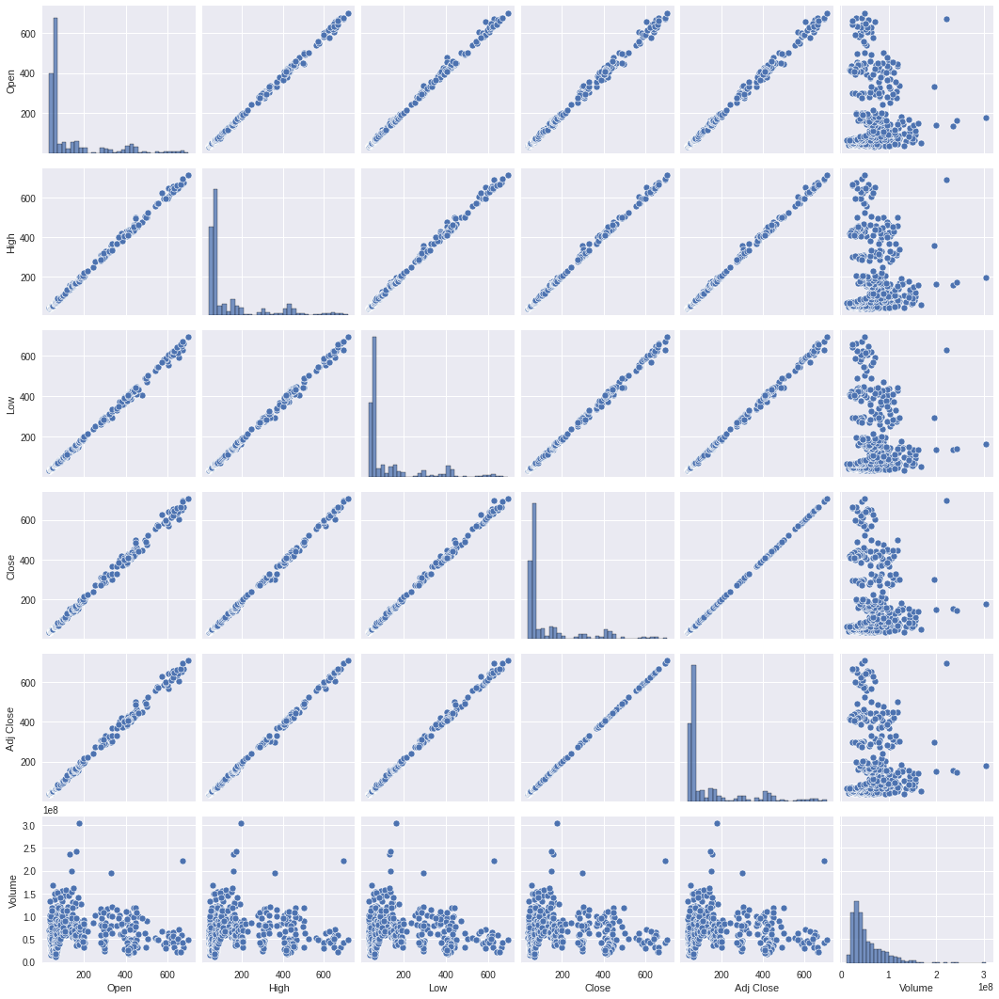

In [73]:
#Creating the pairplot 
sns.pairplot(df[1:]) 
plt.show()

In [74]:
G_tsl = nx.from_numpy_matrix(cor_matrix)
G_tsl = nx.relabel_nodes(G_tsl,lambda x: stocks[x])


In [75]:
G_tsl.get_edge_data('Low','Volume')

{'weight': 0.14097530994348587}

In [76]:
G_tsl.edges

EdgeView([('Open', 'Open'), ('Open', 'High'), ('Open', 'Low'), ('Open', 'Close'), ('Open', 'Adj Close'), ('Open', 'Volume'), ('High', 'High'), ('High', 'Low'), ('High', 'Close'), ('High', 'Adj Close'), ('High', 'Volume'), ('Low', 'Low'), ('Low', 'Close'), ('Low', 'Adj Close'), ('Low', 'Volume'), ('Close', 'Close'), ('Close', 'Adj Close'), ('Close', 'Volume'), ('Adj Close', 'Adj Close'), ('Adj Close', 'Volume'), ('Volume', 'Volume')])

In [77]:
df[['Open','High','Low','Close']].loc['2019-01-01':'2021-01-01'].head()

,Open,High,Low,Close
202,53.478001,53.931999,50.700001,52.0


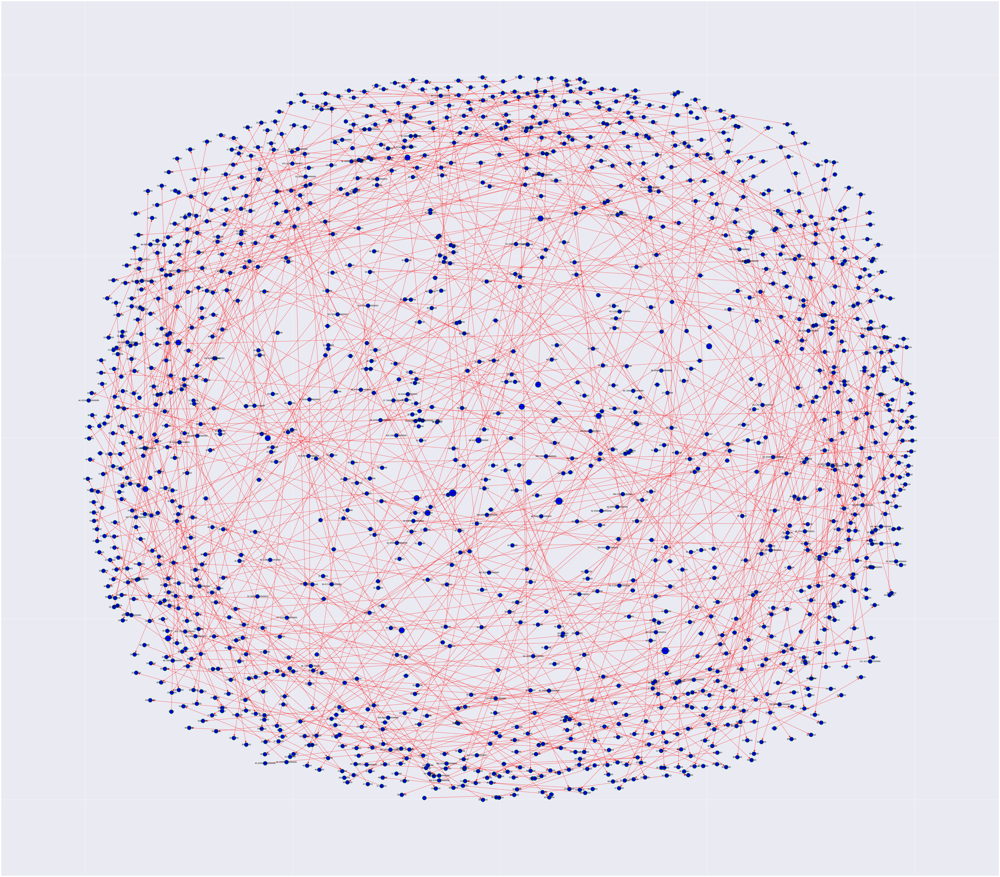

In [78]:
#creating multigraph network with nodes sized in proportion to degree centrality.
g_tsla= nx.from_pandas_edgelist(df, source='Low', target='Volume', 
                                      create_using=nx.MultiDiGraph())
# Computing node degrees,
node_degree = nx.degree(g_tsla)

#graph visualization
layout = nx.spring_layout(g_tsla, k=0.15, iterations=20)
plt.figure(num=None, figsize=(100,90), dpi=80)
nx.draw_networkx(
        g_tsla,
        node_size=[int(degree[1]) * 500 for degree in node_degree],
        arrowsize=20,
        linewidths=2,
        pos=layout,
        edge_color='red',
        edgecolors='green',
        node_color='blue',
    )